# Twitter Sentiment analysis
# Perception of the Covid-19 vaccine

The main purpose of this project is to measure the public response to the COVID-19 vaccine with sentiment analysis. 
In order to analyze the public opinions and emotions related to the vaccine during the pandemic, I will be utilizing recent Twitter streaming data

* We try to answer What is the public perception regarding Covid-19 vaccination? 
* Which regions are pro or anti vaccine based on Twitter data?



Install Necessary Packages

In [2]:
import tweepy
import sys
from tweepy import Stream
from tweepy import OAuthHandler
# from tweepy.streaming import StreamListener
import time
import datetime 
from tqdm import tqdm
import pandas as pd

In [3]:
import numpy as np
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import string
from sklearn.feature_extraction.text import CountVectorizer
import nltk 
from nltk.corpus import stopwords
import re
pd.set_option('display.max_colwidth', 100)
import unicodedata
import plotly.graph_objects as go
import seaborn as sns
from nltk import bigrams
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
from plotly.subplots import make_subplots
from nltk.util import ngrams

Extract tweets based on certain topics from Twitter API using the Tweepy library


In [4]:
#Twitter developer account credentials

consumer_key="ArvY8sU6HDZSuGk9nMADCd1Za"
consumer_secret="WhhxixavlxGgAsr6nHwwjmsEDdNCBGCC2LxHJWLl0Tho5OcTKe"
access_token="2415738176-GCKuN5W25sftYfjOMXMgA1UXaS6kHkl8gYnMWGm"
access_token_secret="GBzgC4NrDA4XhCf7CS6md1zQuNmm0o458rhJSqfz3PFki"
BEARER_TOKEN = "AAAAAAAAAAAAAAAAAAAAAB%2FTNwEAAAAAVJ9eZ2QOZtV6XLvnSyKpFLXsSvM%3DxZ6H7C5dNsJTvzttvypgHnedYpByZ9bUOgvxQXXLVHf2TdAEFU"

#Switching to application authentication
auth = tweepy.OAuthHandler(consumer_key,consumer_secret)
auth.set_access_token(access_token, access_token_secret)
auth.secure = True

#Setting up api wrapper, using authentication only
api = tweepy.API(auth, wait_on_rate_limit=True)

#Error handling
if (not api):
    print ("Problem connecting to API")

#You can check how many queries you have left using rate_limit_status() method
api.rate_limit_status()['resources']['search']

# if (not api):
#     print("Authentication failed!")
#     sys.exit(-1)

{'/search/tweets': {'limit': 180, 'remaining': 180, 'reset': 1669724859}}

In [5]:
#Switching to application authentication
auth = tweepy.AppAuthHandler(consumer_key, consumer_secret)

#Setting up new api wrapper, using authentication only
api = tweepy.API(auth, wait_on_rate_limit=True)

#Error handling
if (not api):
    print ("Problem Connecting to API")

In [6]:
#Maximum number of tweets we want to collect 
number_tweets= 1000
#The twitter Search API allows up to 100 tweets per query
tweetsPerQry = 100

#search_words
search_words= '''covidvaccine OR vaccination 
                   AND coronavirus OR covid
                   AND pro OR antivax OR antivaxxer
                   OR vaccineswork '''

retweet_filter='-filter:retweets'

q=search_words+retweet_filter
date_since= "2020-12-08"
#date_until= "2021-04-14"
tweetCount = 0
geo =[]
tweets=[]
likes=[]
user=[]
location= []
date=[]

for tweet in tweepy.Cursor(api.search_tweets, q= q,lang="en",since= date_since, tweet_mode='extended').items(number_tweets) :
        geo.append(tweet.geo)
        tweets.append(tweet.full_text)
        likes.append(tweet.favorite_count)
        user.append(tweet.user.screen_name)
        location.append(tweet.user.location)
        date.append(tweet.created_at)
        tweetCount += 1
    #Display how many tweets we have collected
print("Downloaded {0} tweets".format(tweetCount))

vacc_tweet_5= pd.DataFrame({'geo':geo,'tweets':tweets,'likes':likes,'user':user,'location':location,'date': date})


Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since
Unexpected parameter: since


Downloaded 70 tweets


In [7]:
vacc_tweet_5.to_csv('C:/Users/o/Downloads/Big-Data-2/vacc_tweet.csv',index=False)


Also i used the kaggle data set on covid vaccine : https://www.kaggle.com/kaushiksuresh147/covidvaccine-tweets since we are working on big data. Data should be large in volume.

Loading the combined tweets

In [8]:
tweet = pd.read_csv('C:/Users/o/Downloads/Big-Data-2/vaccination_all_tweets.csv')
tweet

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1.340540e+18,Rachel Roh,"La Crescenta-Montrose, CA","Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' ...",4/8/09 17:52,405,1692,3247,False,12/20/20 6:06,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1.338160e+18,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all th...",9/21/09 15:27,834,666,178,False,12/13/20 16:27,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat...",NaN,Twitter Web App,1,1,False
2,1.337860e+18,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",6/25/20 23:30,10,88,155,False,12/12/20 20:33,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'PfizerBioNTech', 'Moderna', 'Covid_19']",Twitter for Android,0,0,False
3,1.337860e+18,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radio Network. Weeknights 7 Pacific-10 Eastern - Email...",9/10/08 11:28,49165,3933,21853,True,12/12/20 20:23,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ...",NaN,Twitter Web App,446,2129,False
4,1.337850e+18,Citizen News Channel,NaN,Citizen News Channel bringing you an alternative news source from citizen journalists that haven...,4/23/20 17:58,152,580,1473,False,12/12/20 20:17,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36995,1.371720e+18,Sukhoi Su-57 Felon 🇷🇺🇮🇳,India,"i am a Defence analyst of DFI.. News i post or Copy paste from Different forums, ..🇷🇺🇮🇳, RT's a...",6/30/18 17:52,17169,320,92360,False,3/16/21 7:14,The EU intends to start negotiations on the purchase of #Russian #SputnikV vaccine.\n\nAt the mo...,"['Russian', 'SputnikV']",Twitter Web App,2,9,False
36996,1.371720e+18,あかげたん,NaN,NaN,11/7/16 15:44,54,52,4327,False,3/16/21 6:56,#Astrazaneca \n#vactine \n#SputnikV \n\nPlease give me as a substitute for Sputnik.\nIt's an eme...,"['Astrazaneca', 'vactine', 'SputnikV']",Twitter for iPad,0,0,False
36997,1.371720e+18,A Night Creature,NaN,I.C.U Health Care Provider as nurse\n\nBeheshti medical science university,2/29/16 9:28,108,179,10409,False,3/16/21 6:49,finally\n\n#SputnikV https://t.co/iu2QDGHa70,['SputnikV'],Twitter Web App,0,8,False
36998,1.371710e+18,maurizio agazzi,NaN,sono un guitto prestato alla finanza chi malauguratamente dovesse seguirmi per le mie idee è avv...,5/20/11 14:56,4469,4051,53804,False,3/16/21 6:41,Hastatoputin #AstraZeneca #SputnikV,"['AstraZeneca', 'SputnikV']",Twitter for iPhone,0,0,False


In [9]:
print('Dataset size:',tweet.shape)
print('Columns are:',tweet.columns)

Dataset size: (37000, 16)
Columns are: Index(['id', 'user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'retweets', 'favorites',
       'is_retweet'],
      dtype='object')


In [10]:
tweet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37000 entries, 0 to 36999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                37000 non-null  float64
 1   user_name         37000 non-null  object 
 2   user_location     28537 non-null  object 
 3   user_description  34459 non-null  object 
 4   user_created      37000 non-null  object 
 5   user_followers    37000 non-null  int64  
 6   user_friends      37000 non-null  int64  
 7   user_favourites   37000 non-null  int64  
 8   user_verified     37000 non-null  bool   
 9   date              37000 non-null  object 
 10  text              37000 non-null  object 
 11  hashtags          29139 non-null  object 
 12  source            36970 non-null  object 
 13  retweets          37000 non-null  int64  
 14  favorites         37000 non-null  int64  
 15  is_retweet        37000 non-null  bool   
dtypes: bool(2), float64(1), int64(5), object

In [11]:
#Covert Date D type object to Date type
tweet['date'] = pd.to_datetime(tweet['date'])

In [12]:
# All tweets from December 2020 to May 2021.
tweet.date.value_counts()

2021-03-03 16:39:00    15
2021-03-01 04:16:00    14
2021-03-01 04:33:00    13
2021-03-02 23:02:00    13
2021-03-01 05:22:00    13
                       ..
2021-03-16 06:00:00     1
2021-02-03 22:26:00     1
2021-03-23 18:49:00     1
2021-03-07 07:00:00     1
2021-02-12 12:32:00     1
Name: date, Length: 27780, dtype: int64

In [13]:
print(min(tweet['date']))
print(max(tweet['date']))

2020-12-12 11:55:00
2021-03-24 08:55:00


In [14]:
#Extract only the month and year from date & Time
tweet['month_year'] = tweet['date'].dt.strftime('%B-%Y')

In [15]:
print(min(tweet['month_year']))
print(max(tweet['month_year']))

December-2020
March-2021


## Exploratory Data Analysis 
Checking for missing values

We see that Location column has 24.4% of Null values from a total of 50351 tweets

In [16]:
missing_values = pd.DataFrame()
missing_values['column'] = tweet.columns

missing_values['percent'] = [round(100* tweet[col].isnull().sum() / len(tweet), 2) for col in tweet.columns]
missing_values = missing_values.sort_values('percent')
missing_values = missing_values[missing_values['percent']>0]
missing_values.head()

,column,percent
12,source,0.08
3,user_description,6.87
11,hashtags,21.25
2,user_location,22.87


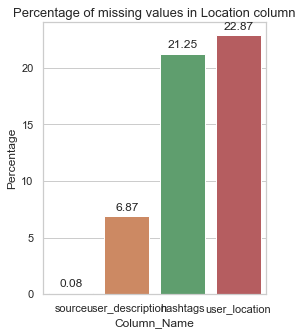

In [17]:
plt.figure(figsize=(4, 5))
sns.set(style='whitegrid')
splot=sns.barplot(x='column', y='percent', data= missing_values)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.xlabel("Column_Name")
plt.ylabel("Percentage")
plt.title("Percentage of missing values in Location column",size=13)
plt.show()

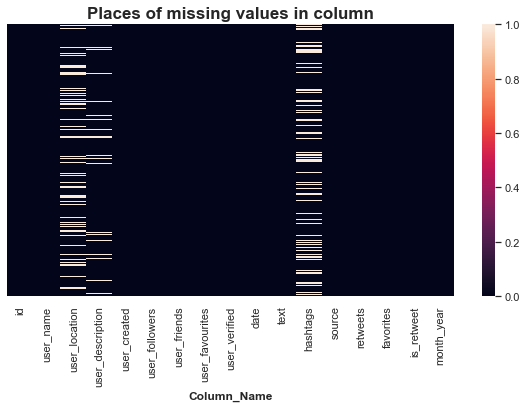

In [18]:
plt.figure(figsize=(10, 5))
sns.heatmap(tweet.isnull(), cbar=True, yticklabels=False)
plt.xlabel("Column_Name", size=12, weight="bold")
plt.title("Places of missing values in column",fontweight="bold",size=17)
plt.show()

## Location Exploratory Analysis

In [19]:
#Top Location of tweets
loc_analysis = pd.DataFrame(tweet['user_location'].value_counts().sort_values(ascending=False))
loc_analysis = loc_analysis.rename(columns={'user_location':'count'})

In [20]:
data = {
   "values": loc_analysis['count'][:15],
   "labels": loc_analysis.index[:15],
   "domain": {"column": 0},
   "name": "Location Name",
   "hoverinfo":"label+percent+name",
   "hole": .3,
   "type": "pie"
}
layout = go.Layout(title="<b>Ratio of Location</b>", legend=dict(x=0.1, y=1.1, orientation="h"))

data = [data]
fig = go.Figure(data = data, layout = layout)
fig.update_layout(title_x=0.5)
fig.show()

c:\users\o\appdata\local\programs\python\python37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



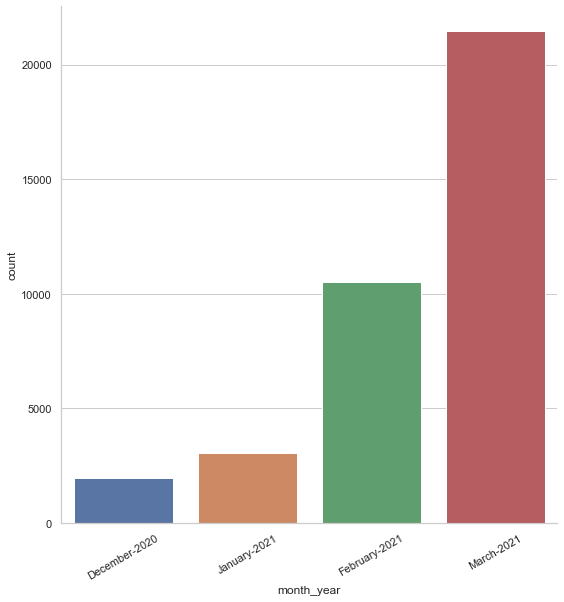

In [21]:
#Number of tweets by Month
g= sns.catplot("month_year", data=tweet, kind="count", height=8)
g.set_xticklabels(rotation=30)

Number of tweets in March 2021 is highest


In [22]:
#Top 10 location of tweets
Top_Location_Of_tweet= tweet['user_location'].value_counts().head(10)

sns.set(rc={'figure.figsize':(12,8)})
sns.set_style('white')
Top_Location_Of_tweet.head(10)

India                             1056
Toronto, Canada  and Worldwide     606
New Delhi, India                   468
London, England                    362
United States                      361
Beijing, China                     333
Mumbai, India                      283
London                             263
Beijing                            244
New Delhi                          210
Name: user_location, dtype: int64

In [23]:
#convert to dataframe
Top_Location_Of_tweet_df=pd.DataFrame(Top_Location_Of_tweet)
Top_Location_Of_tweet_df.reset_index(inplace=True)
Top_Location_Of_tweet_df.rename(columns={'index':'Location', 'location':'Location_Count'}, inplace=True)
Top_Location_Of_tweet_df

,Location,user_location
0,India,1056
1,"Toronto, Canada and Worldwide",606
2,"New Delhi, India",468
3,"London, England",362
4,United States,361
5,"Beijing, China",333
6,"Mumbai, India",283
7,London,263
8,Beijing,244
9,New Delhi,210


In [24]:
#Considering only the tweets
df = pd.DataFrame(tweet[['text']])
df.head()

,text
0,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat..."
2,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ..."
4,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...


In [25]:
tweet_all = " ".join(review for review in df.text)
print ("There are {} words in the combination of all tweets.".format(len(tweet_all)))

There are 4726703 words in the combination of all tweets.


In [26]:
# Create and generate a word cloud image:
wordcloud_all = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(tweet_all)

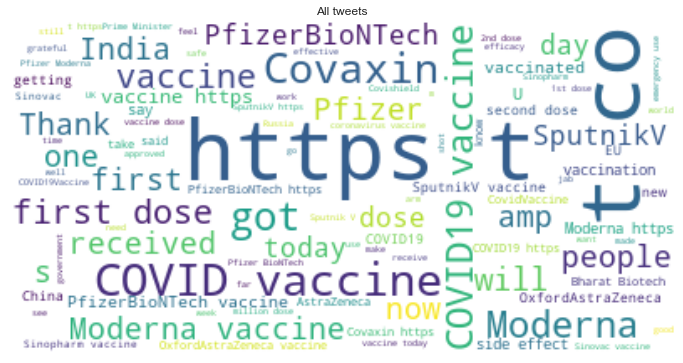

In [27]:
#plot wordcloud
plt.figure()
plt.imshow(wordcloud_all, interpolation="bilinear")
plt.title("All tweets")
plt.axis("off")
plt.show()

## Pre-processing text data
Most of the text data are cleaned by following below steps.

* Remove punctuations
* Tokenization - Converting a sentence into list of words
* Remove stopwords
* Lemmatization/stemming - Tranforming any form of a word to its root word

In [28]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [29]:
#Remove Punctuation
def remove_punct(twt):
    twt  = "".join([char for char in twt if char not in string.punctuation])    
    twt1 = re.sub('[0-9]+', '', twt)
    #remove mentions@
    twt1 = re.sub(r'@[A-Za-z0-9_]+', '', twt1)
    # Remove hashtags
    twt1 = re.sub(r'#', '', twt1)
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    no_url = url_pattern.sub(r'', twt1)
    text = (unicodedata.normalize('NFKD', no_url).encode('ascii', 'ignore').decode('utf-8', 'ignore'))
    return text

df['tweet_punct'] = df['text'].apply(lambda x: remove_punct(x.lower()))
df.head(10)

,text,tweet_punct
0,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,same folks said daikon paste could treat a cytokine storm pfizerbiontech httpstcoxehhimgkf
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat...",while the world has been on the wrong side of history this year hopefully the biggest vaccinatio...
2,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...,coronavirus sputnikv astrazeneca pfizerbiontech moderna covid russian vaccine is created to last...
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ...",facts are immutable senator even when youre not ethically sturdy enough to acknowledge them you...
4,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...,explain to me again why we need a vaccine borisjohnson matthancock whereareallthesickpeople pfiz...
5,Does anyone have any useful advice/guidance for whether the COVID vaccine is safe whilst breastf...,does anyone have any useful adviceguidance for whether the covid vaccine is safe whilst breastfe...
6,it is a bit sad to claim the fame for success of #vaccination on patriotic competition between U...,it is a bit sad to claim the fame for success of vaccination on patriotic competition between us...
7,There have not been many bright days in 2020 but here are some of the best \n1. #BidenHarris win...,there have not been many bright days in but here are some of the best \n bidenharris winning el...
8,Covid vaccine; You getting it?\n\n #CovidVaccine #covid19 #PfizerBioNTech #Moderna,covid vaccine you getting it\n\n covidvaccine covid pfizerbiontech moderna
9,"#CovidVaccine \n\nStates will start getting #COVID19Vaccine Monday, #US says \n#pakustv #NYC #He...",covidvaccine \n\nstates will start getting covidvaccine monday us says \npakustv nyc healthcare ...


There are 4301106 words in the combination of all tweets.


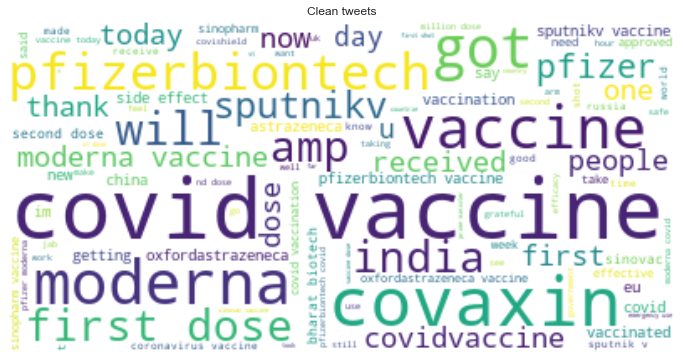

In [30]:
# Create and generate a word cloud image:
tweet_clean = " ".join(review for review in df.tweet_punct)
print ("There are {} words in the combination of all tweets.".format(len(tweet_clean)))

wordcloud_all = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(tweet_clean)
#plot wordcloud
plt.figure()
plt.imshow(wordcloud_all, interpolation="bilinear")
plt.title("Clean tweets")
plt.axis("off")
plt.show()

In [31]:
#Tweet Tokenization
def tokenization(twt):
    twt = re.split('\W+', twt)
    return twt

df['Tweet_tokenized'] = df['tweet_punct'].apply(lambda x: tokenization(x))
df.head()

,text,tweet_punct,Tweet_tokenized
0,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,same folks said daikon paste could treat a cytokine storm pfizerbiontech httpstcoxehhimgkf,"[same, folks, said, daikon, paste, could, treat, a, cytokine, storm, pfizerbiontech, httpstcoxeh..."
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat...",while the world has been on the wrong side of history this year hopefully the biggest vaccinatio...,"[while, the, world, has, been, on, the, wrong, side, of, history, this, year, hopefully, the, bi..."
2,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...,coronavirus sputnikv astrazeneca pfizerbiontech moderna covid russian vaccine is created to last...,"[coronavirus, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccine, is, creat..."
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ...",facts are immutable senator even when youre not ethically sturdy enough to acknowledge them you...,"[facts, are, immutable, senator, even, when, youre, not, ethically, sturdy, enough, to, acknowle..."
4,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...,explain to me again why we need a vaccine borisjohnson matthancock whereareallthesickpeople pfiz...,"[explain, to, me, again, why, we, need, a, vaccine, borisjohnson, matthancock, whereareallthesic..."


In [32]:
#Removing stopwords
def remove_stopwords(twt):
    stopword = nltk.corpus.stopwords.words('english') 
    twt = [word for word in twt if word not in stopword]
    return twt
    
df['tweet_nonstop'] = df['Tweet_tokenized'].apply(lambda x: remove_stopwords(x))
#df.drop('tweet_nonstop2', axis=1)
df.head(15)

,text,tweet_punct,Tweet_tokenized,tweet_nonstop
0,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,same folks said daikon paste could treat a cytokine storm pfizerbiontech httpstcoxehhimgkf,"[same, folks, said, daikon, paste, could, treat, a, cytokine, storm, pfizerbiontech, httpstcoxeh...","[folks, said, daikon, paste, could, treat, cytokine, storm, pfizerbiontech, httpstcoxehhimgkf]"
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat...",while the world has been on the wrong side of history this year hopefully the biggest vaccinatio...,"[while, the, world, has, been, on, the, wrong, side, of, history, this, year, hopefully, the, bi...","[world, wrong, side, history, year, hopefully, biggest, vaccination, effort, weve, ev, httpstcod..."
2,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...,coronavirus sputnikv astrazeneca pfizerbiontech moderna covid russian vaccine is created to last...,"[coronavirus, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccine, is, creat...","[coronavirus, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccine, created, ..."
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ...",facts are immutable senator even when youre not ethically sturdy enough to acknowledge them you...,"[facts, are, immutable, senator, even, when, youre, not, ethically, sturdy, enough, to, acknowle...","[facts, immutable, senator, even, youre, ethically, sturdy, enough, acknowledge, born, httpstcoj..."
4,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...,explain to me again why we need a vaccine borisjohnson matthancock whereareallthesickpeople pfiz...,"[explain, to, me, again, why, we, need, a, vaccine, borisjohnson, matthancock, whereareallthesic...","[explain, need, vaccine, borisjohnson, matthancock, whereareallthesickpeople, pfizerbiontech, ht..."
5,Does anyone have any useful advice/guidance for whether the COVID vaccine is safe whilst breastf...,does anyone have any useful adviceguidance for whether the covid vaccine is safe whilst breastfe...,"[does, anyone, have, any, useful, adviceguidance, for, whether, the, covid, vaccine, is, safe, w...","[anyone, useful, adviceguidance, whether, covid, vaccine, safe, whilst, breastfeeding, httpstcoe..."
6,it is a bit sad to claim the fame for success of #vaccination on patriotic competition between U...,it is a bit sad to claim the fame for success of vaccination on patriotic competition between us...,"[it, is, a, bit, sad, to, claim, the, fame, for, success, of, vaccination, on, patriotic, compet...","[bit, sad, claim, fame, success, vaccination, patriotic, competition, usa, canada, uk, httpstcoi..."
7,There have not been many bright days in 2020 but here are some of the best \n1. #BidenHarris win...,there have not been many bright days in but here are some of the best \n bidenharris winning el...,"[there, have, not, been, many, bright, days, in, but, here, are, some, of, the, best, bidenharri...","[many, bright, days, best, bidenharris, winning, election, httpstcoufxxfx]"
8,Covid vaccine; You getting it?\n\n #CovidVaccine #covid19 #PfizerBioNTech #Moderna,covid vaccine you getting it\n\n covidvaccine covid pfizerbiontech moderna,"[covid, vaccine, you, getting, it, covidvaccine, covid, pfizerbiontech, moderna]","[covid, vaccine, getting, covidvaccine, covid, pfizerbiontech, moderna]"
9,"#CovidVaccine \n\nStates will start getting #COVID19Vaccine Monday, #US says \n#pakustv #NYC #He...",covidvaccine \n\nstates will start getting covidvaccine monday us says \npakustv nyc healthcare ...,"[covidvaccine, states, will, start, getting, covidvaccine, monday, us, says, pakustv, nyc, healt...","[covidvaccine, states, start, getting, covidvaccine, monday, us, says, pakustv, nyc, healthcare,..."


In [33]:
# Tried Stemming: removing the last few characters of a given word
ps = nltk.PorterStemmer()

def stemming(twt):
    twt = [ps.stem(word) for word in twt]
    return twt

df['Tweet_stemmed'] = df['tweet_nonstop'].apply(lambda x: stemming(x))
df.head(15)

,text,tweet_punct,Tweet_tokenized,tweet_nonstop,Tweet_stemmed
0,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,same folks said daikon paste could treat a cytokine storm pfizerbiontech httpstcoxehhimgkf,"[same, folks, said, daikon, paste, could, treat, a, cytokine, storm, pfizerbiontech, httpstcoxeh...","[folks, said, daikon, paste, could, treat, cytokine, storm, pfizerbiontech, httpstcoxehhimgkf]","[folk, said, daikon, past, could, treat, cytokin, storm, pfizerbiontech, httpstcoxehhimgkf]"
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat...",while the world has been on the wrong side of history this year hopefully the biggest vaccinatio...,"[while, the, world, has, been, on, the, wrong, side, of, history, this, year, hopefully, the, bi...","[world, wrong, side, history, year, hopefully, biggest, vaccination, effort, weve, ev, httpstcod...","[world, wrong, side, histori, year, hope, biggest, vaccin, effort, weve, ev, httpstcodlchrzjkhm]"
2,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...,coronavirus sputnikv astrazeneca pfizerbiontech moderna covid russian vaccine is created to last...,"[coronavirus, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccine, is, creat...","[coronavirus, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccine, created, ...","[coronaviru, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccin, creat, last..."
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ...",facts are immutable senator even when youre not ethically sturdy enough to acknowledge them you...,"[facts, are, immutable, senator, even, when, youre, not, ethically, sturdy, enough, to, acknowle...","[facts, immutable, senator, even, youre, ethically, sturdy, enough, acknowledge, born, httpstcoj...","[fact, immut, senat, even, your, ethic, sturdi, enough, acknowledg, born, httpstcojqgvkch]"
4,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...,explain to me again why we need a vaccine borisjohnson matthancock whereareallthesickpeople pfiz...,"[explain, to, me, again, why, we, need, a, vaccine, borisjohnson, matthancock, whereareallthesic...","[explain, need, vaccine, borisjohnson, matthancock, whereareallthesickpeople, pfizerbiontech, ht...","[explain, need, vaccin, borisjohnson, matthancock, whereareallthesickpeopl, pfizerbiontech, http..."
5,Does anyone have any useful advice/guidance for whether the COVID vaccine is safe whilst breastf...,does anyone have any useful adviceguidance for whether the covid vaccine is safe whilst breastfe...,"[does, anyone, have, any, useful, adviceguidance, for, whether, the, covid, vaccine, is, safe, w...","[anyone, useful, adviceguidance, whether, covid, vaccine, safe, whilst, breastfeeding, httpstcoe...","[anyon, use, adviceguid, whether, covid, vaccin, safe, whilst, breastfeed, httpstcoeifsyqoekn]"
6,it is a bit sad to claim the fame for success of #vaccination on patriotic competition between U...,it is a bit sad to claim the fame for success of vaccination on patriotic competition between us...,"[it, is, a, bit, sad, to, claim, the, fame, for, success, of, vaccination, on, patriotic, compet...","[bit, sad, claim, fame, success, vaccination, patriotic, competition, usa, canada, uk, httpstcoi...","[bit, sad, claim, fame, success, vaccin, patriot, competit, usa, canada, uk, httpstcoifmraygytp]"
7,There have not been many bright days in 2020 but here are some of the best \n1. #BidenHarris win...,there have not been many bright days in but here are some of the best \n bidenharris winning el...,"[there, have, not, been, many, bright, days, in, but, here, are, some, of, the, best, bidenharri...","[many, bright, days, best, bidenharris, winning, election, httpstcoufxxfx]","[mani, bright, day, best, bidenharri, win,

In [34]:
wn = nltk.stem.WordNetLemmatizer()

def lemmatizer(twt):
    twt = [wn.lemmatize(word) for word in twt]
    return twt

df['Tweet_lemmatized'] = df['tweet_nonstop'].apply(lambda x: lemmatizer(x))
df.head(15)

,text,tweet_punct,Tweet_tokenized,tweet_nonstop,Tweet_stemmed,Tweet_lemmatized
0,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,same folks said daikon paste could treat a cytokine storm pfizerbiontech httpstcoxehhimgkf,"[same, folks, said, daikon, paste, could, treat, a, cytokine, storm, pfizerbiontech, httpstcoxeh...","[folks, said, daikon, paste, could, treat, cytokine, storm, pfizerbiontech, httpstcoxehhimgkf]","[folk, said, daikon, past, could, treat, cytokin, storm, pfizerbiontech, httpstcoxehhimgkf]","[folk, said, daikon, paste, could, treat, cytokine, storm, pfizerbiontech, httpstcoxehhimgkf]"
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat...",while the world has been on the wrong side of history this year hopefully the biggest vaccinatio...,"[while, the, world, has, been, on, the, wrong, side, of, history, this, year, hopefully, the, bi...","[world, wrong, side, history, year, hopefully, biggest, vaccination, effort, weve, ev, httpstcod...","[world, wrong, side, histori, year, hope, biggest, vaccin, effort, weve, ev, httpstcodlchrzjkhm]","[world, wrong, side, history, year, hopefully, biggest, vaccination, effort, weve, ev, httpstcod..."
2,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...,coronavirus sputnikv astrazeneca pfizerbiontech moderna covid russian vaccine is created to last...,"[coronavirus, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccine, is, creat...","[coronavirus, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccine, created, ...","[coronaviru, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccin, creat, last...","[coronavirus, sputnikv, astrazeneca, pfizerbiontech, moderna, covid, russian, vaccine, created, ..."
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ...",facts are immutable senator even when youre not ethically sturdy enough to acknowledge them you...,"[facts, are, immutable, senator, even, when, youre, not, ethically, sturdy, enough, to, acknowle...","[facts, immutable, senator, even, youre, ethically, sturdy, enough, acknowledge, born, httpstcoj...","[fact, immut, senat, even, your, ethic, sturdi, enough, acknowledg, born, httpstcojqgvkch]","[fact, immutable, senator, even, youre, ethically, sturdy, enough, acknowledge, born, httpstcojq..."
4,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...,explain to me again why we need a vaccine borisjohnson matthancock whereareallthesickpeople pfiz...,"[explain, to, me, again, why, we, need, a, vaccine, borisjohnson, matthancock, whereareallthesic...","[explain, need, vaccine, borisjohnson, matthancock, whereareallthesickpeople, pfizerbiontech, ht...","[explain, need, vaccin, borisjohnson, matthancock, whereareallthesickpeopl, pfizerbiontech, http...","[explain, need, vaccine, borisjohnson, matthancock, whereareallthesickpeople, pfizerbiontech, ht..."
5,Does anyone have any useful advice/guidance for whether the COVID vaccine is safe whilst breastf...,does anyone have any useful adviceguidance for whether the covid vaccine is safe whilst breastfe...,"[does, anyone, have, any, useful, adviceguidance, for, whether, the, covid, vaccine, is, safe, w...","[anyone, useful, adviceguidance, whether, covid, vaccine, safe, whilst, breastfeeding, httpstcoe...","[anyon, use, adviceguid, whether, covid, vaccin, safe, whilst, breastfeed, httpstcoeifsyqoekn]","[anyone, useful, adviceguidance, whether, covid, vaccine, safe, whilst, breastfeeding, httpstcoe..."
6,it is a bit sad to claim the fame for success of #vaccination on patriotic competition between U...,it is a bit sad to claim the fame for success of vaccination on patriotic competition between us...,"[it, is, a, bit, sad, to, claim, the, fame, for, success, of, vaccination, on, patriotic, compet...","

In [35]:
#Function to clean the text to remove irrelevant features

def basic_clean(text):
    wnl = nltk.stem.WordNetLemmatizer()
    #remove stopwords
    stopwords = nltk.corpus.stopwords.words('english') #+ ADDITIONAL_STOPWORDS
    #removing non-ASCII characters,normalization, encoding/decoding, lower casing, and lemmatization.
    text = (unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore').lower())
    # Remove mentions
    text = re.sub(r'@[A-Za-z0-9_]+', '', text)
    # Remove hashtags
    text = re.sub(r'#', '', text)
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    text = url_pattern.sub(r'', text)
    text = re.sub('[0-9]+', '', text)
    words = re.sub(r'[^\w\s]', '', text).split()
    text = [wnl.lemmatize(word) for word in words if word not in stopwords]
    return text

In [36]:
tweet_cln = basic_clean(''.join(str(df['text'].tolist())))
tweet_cln

['folk',
 'said',
 'daikon',
 'paste',
 'could',
 'treat',
 'cytokine',
 'storm',
 'pfizerbiontech',
 'world',
 'wrong',
 'side',
 'history',
 'year',
 'hopefully',
 'biggest',
 'vaccination',
 'effort',
 'weve',
 'ev',
 'coronavirus',
 'sputnikv',
 'astrazeneca',
 'pfizerbiontech',
 'moderna',
 'covid_',
 'russian',
 'vaccine',
 'created',
 'last',
 'year',
 'fact',
 'immutable',
 'senator',
 'even',
 'youre',
 'ethically',
 'sturdy',
 'enough',
 'acknowledge',
 'born',
 'explain',
 'need',
 'vaccine',
 'whereareallthesickpeople',
 'pfizerbiontech',
 'anyone',
 'useful',
 'adviceguidance',
 'whether',
 'covid',
 'vaccine',
 'safe',
 'whilst',
 'breastfeeding',
 'bit',
 'sad',
 'claim',
 'fame',
 'success',
 'vaccination',
 'patriotic',
 'competition',
 'usa',
 'canada',
 'uk',
 'many',
 'bright',
 'day',
 'best',
 'n',
 'bidenharris',
 'winning',
 'election',
 'covid',
 'vaccine',
 'getting',
 'itnn',
 'covidvaccine',
 'covid',
 'pfizerbiontech',
 'moderna',
 'covidvaccine',
 'nnstate

In [37]:
len(tweet_cln)

351147

## Top 30 Unigrams

In [38]:
unigram =(pd.Series(nltk.ngrams(tweet_cln , 1)).value_counts())[:30]
unigram
#print(type(unigram))

(vaccine,)              16110
(covid,)                 8799
(moderna,)               6867
(covaxin,)               4505
(first,)                 4014
(pfizerbiontech,)        3763
(dose,)                  3359
(sputnikv,)              2967
(got,)                   2460
(covidvaccine,)          2439
(today,)                 2162
(pfizer,)                2054
(shot,)                  2033
(get,)                   1936
(vaccination,)           1849
(oxfordastrazeneca,)     1832
(amp,)                   1798
(dos,)                   1660
(sinovac,)               1526
(vaccinated,)            1525
(sinopharm,)             1501
(second,)                1445
(india,)                 1400
(day,)                   1343
(people,)                1340
(one,)                   1329
(russia,)                1299
(coronavirus,)           1287
(china,)                 1281
(received,)              1197
dtype: int64

In [39]:
#Top 20 Bigrams
bigram =(pd.Series(nltk.ngrams(tweet_cln , 2)).value_counts())[:20]
bigram

(covid, vaccine)                4163
(first, dose)                   1299
(moderna, vaccine)              1079
(pfizerbiontech, vaccine)        851
(got, first)                     687
(sputnikv, vaccine)              652
(side, effect)                   626
(pfizer, moderna)                570
(dose, moderna)                  547
(second, dose)                   536
(oxfordastrazeneca, vaccine)     529
(bharat, biotech)                498
(covid, vaccination)             461
(sinopharm, vaccine)             460
(coronavirus, vaccine)           450
(vaccine, today)                 422
(sputnik, v)                     401
(nd, dose)                       375
(moderna, covid)                 375
(russia, sputnikv)               371
dtype: int64

In [40]:
#Top 20 Trigrams
trigram =(pd.Series(nltk.ngrams(tweet_cln , 3)).value_counts())[:20]
trigram

(dose, covid, vaccine)              286
(got, first, dose)                  270
(pfizerbiontech, covid, vaccine)    263
(moderna, covid, vaccine)           244
(first, dose, covid)                242
(first, dose, moderna)              217
(reporting, case, covid)            200
(dose, moderna, vaccine)            197
(sinovac, covid, vaccine)           188
(sinopharm, covid, vaccine)         167
(received, first, dose)             160
(covid, vaccine, today)             156
(bharat, biotech, covaxin)          156
(case, covid, new)                  149
(russia, sputnikv, vaccine)         149
(took, first, dose)                 148
(sputnik, v, vaccine)               147
(trudeau, toronto, ontario)         147
(ontario, reporting, case)          145
(toronto, ontario, canada)          144
dtype: int64

Text(0.5, 0, 'No. of Occurances')

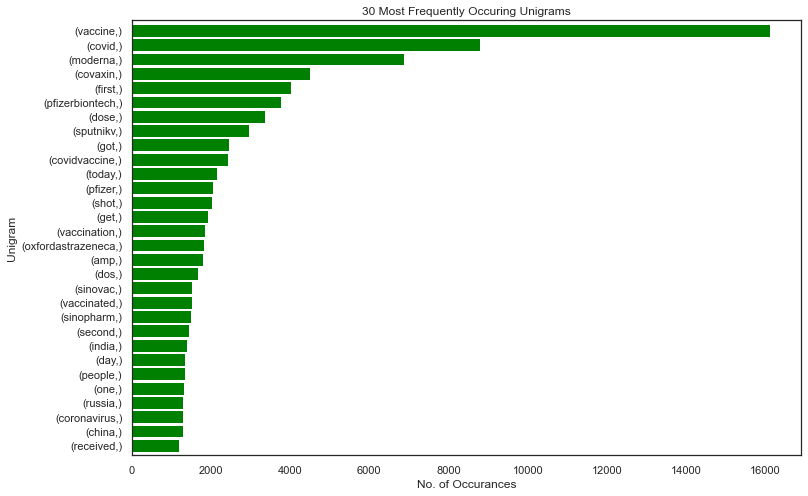

In [41]:
#Plot Unigram
unigram.sort_values().plot.barh(color='green', width=.9, figsize=(12, 8))
plt.title('30 Most Frequently Occuring Unigrams')
plt.ylabel('Unigram')
plt.xlabel('No. of Occurances')

Text(0.5, 0, 'No. of Occurances')

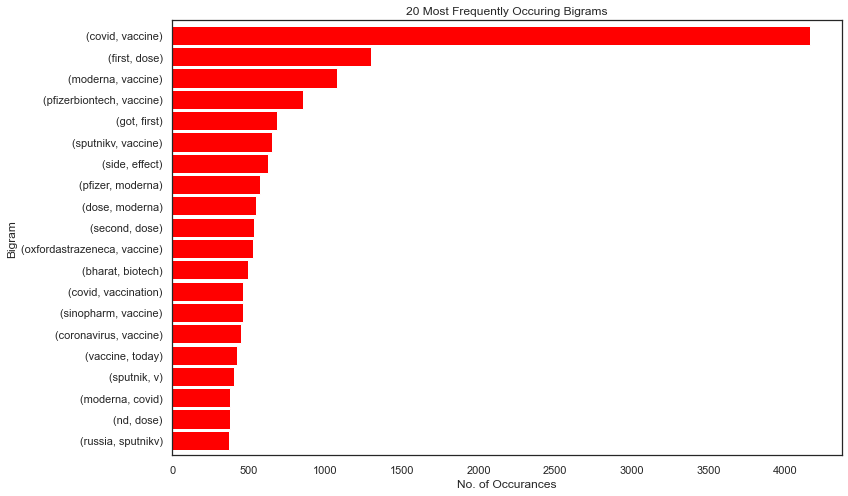

In [42]:
bigram.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('No. of Occurances')

Text(0.5, 0, 'No. of Occurances')

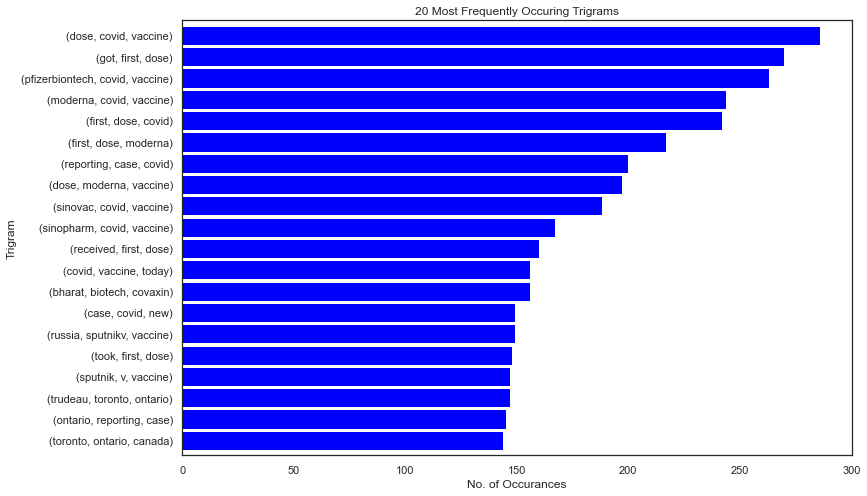

In [43]:
trigram.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('No. of Occurances')

## Scoring Sentiment
* Import VADER((Valence Aware Dictionary and sEntiment Reasoner) model and using its methods, define separate functions to return compound, positive, negative and neutral scores.

* This method combines a lexicon approach with a rule-based approach to provide a high level of accuracy when scoring sentiment on social media.The sentiment analyzer is run by passing each string to the polarity_scores method. 

* The result is a dictionary with four elements: neg, neu, pos, and compound. These represent the negative, neutral and positive sentiment as measured by the analyser plus a combination of the scores to produce an overall sentiment value.
* neg, neu, pos, are in the range 0 to 1, whereas the compound result is between -1 and +1: a negative value represents a negative sentiment value and positive value means a positive sentiment. A value around zero means that the sentiment expressed is neutral.

In [44]:
f_data = pd.DataFrame(tweet[['text','user_location','date']])
f_data.head()

,text,user_location,date
0,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,"La Crescenta-Montrose, CA",2020-12-20 06:06:00
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat...","San Francisco, CA",2020-12-13 16:27:00
2,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...,Your Bed,2020-12-12 20:33:00
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ...","Vancouver, BC - Canada",2020-12-12 20:23:00
4,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...,NaN,2020-12-12 20:17:00


In [45]:
f_data['tweet_punct'] = f_data['text'].apply(lambda x: remove_punct(x.lower()))
f_data.head(10)

,text,user_location,date,tweet_punct
0,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,"La Crescenta-Montrose, CA",2020-12-20 06:06:00,same folks said daikon paste could treat a cytokine storm pfizerbiontech httpstcoxehhimgkf
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat...","San Francisco, CA",2020-12-13 16:27:00,while the world has been on the wrong side of history this year hopefully the biggest vaccinatio...
2,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...,Your Bed,2020-12-12 20:33:00,coronavirus sputnikv astrazeneca pfizerbiontech moderna covid russian vaccine is created to last...
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ...","Vancouver, BC - Canada",2020-12-12 20:23:00,facts are immutable senator even when youre not ethically sturdy enough to acknowledge them you...
4,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...,NaN,2020-12-12 20:17:00,explain to me again why we need a vaccine borisjohnson matthancock whereareallthesickpeople pfiz...
5,Does anyone have any useful advice/guidance for whether the COVID vaccine is safe whilst breastf...,"Birmingham, England",2020-12-12 20:11:00,does anyone have any useful adviceguidance for whether the covid vaccine is safe whilst breastfe...
6,it is a bit sad to claim the fame for success of #vaccination on patriotic competition between U...,"Austria, Ukraine and Kosovo",2020-12-12 20:06:00,it is a bit sad to claim the fame for success of vaccination on patriotic competition between us...
7,There have not been many bright days in 2020 but here are some of the best \n1. #BidenHarris win...,NaN,2020-12-12 20:04:00,there have not been many bright days in but here are some of the best \n bidenharris winning el...
8,Covid vaccine; You getting it?\n\n #CovidVaccine #covid19 #PfizerBioNTech #Moderna,NaN,2020-12-12 20:01:00,covid vaccine you getting it\n\n covidvaccine covid pfizerbiontech moderna
9,"#CovidVaccine \n\nStates will start getting #COVID19Vaccine Monday, #US says \n#pakustv #NYC #He...",Islamabad,2020-12-12 19:30:00,covidvaccine \n\nstates will start getting covidvaccine monday us says \npakustv nyc healthcare ...


In [46]:
sid = SIA()
f_data['sentiments'] = f_data['text'].apply(lambda x: sid.polarity_scores(' '.join(re.findall(r'\w+',x))))

# Obtaining NLTK compound score
f_data['nltk_cmp_score'] = f_data['sentiments'].apply(lambda score_dict: score_dict['compound'])


f_data['Positive Sentiment'] = f_data['sentiments'].apply(lambda x: x['pos']+1*(10**-6)) 
f_data['Neutral Sentiment'] =f_data['sentiments'].apply(lambda x: x['neu']+1*(10**-6))
f_data['Negative Sentiment'] = f_data['sentiments'].apply(lambda x: x['neg']+1*(10**-6))

In [47]:
f_data.head()

,text,user_location,date,tweet_punct,sentiments,nltk_cmp_score,Positive Sentiment,Neutral Sentiment,Negative Sentiment
0,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,"La Crescenta-Montrose, CA",2020-12-20 06:06:00,same folks said daikon paste could treat a cytokine storm pfizerbiontech httpstcoxehhimgkf,"{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.4019}",0.4019,0.184001,0.816001,0.000001
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccinat...","San Francisco, CA",2020-12-13 16:27:00,while the world has been on the wrong side of history this year hopefully the biggest vaccinatio...,"{'neg': 0.112, 'neu': 0.791, 'pos': 0.097, 'compound': -0.1027}",-0.1027,0.097001,0.791001,0.112001
2,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is create...,Your Bed,2020-12-12 20:33:00,coronavirus sputnikv astrazeneca pfizerbiontech moderna covid russian vaccine is created to last...,"{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.25}",0.2500,0.118001,0.882001,0.000001
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. ...","Vancouver, BC - Canada",2020-12-12 20:23:00,facts are immutable senator even when youre not ethically sturdy enough to acknowledge them you...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001
4,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #...,NaN,2020-12-12 20:17:00,explain to me again why we need a vaccine borisjohnson matthancock whereareallthesickpeople pfiz...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001


### Distribution of Sentiments

c:\users\o\appdata\local\programs\python\python37\lib\site-packages\seaborn\distributions.py:1699: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.1 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\users\o\appdata\local\programs\python\python37\lib\site-packages\seaborn\distributions.py:1699: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.1 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\users\o\appdata\local\programs\python\python37\lib\site-packages\seaborn\distributions.py:1699: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.1 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\users\o\appdata\local\programs\python\python37\lib\site-packages\seaborn\distributions.py:1699: FutureWarning:

The `bw` parameter is depre

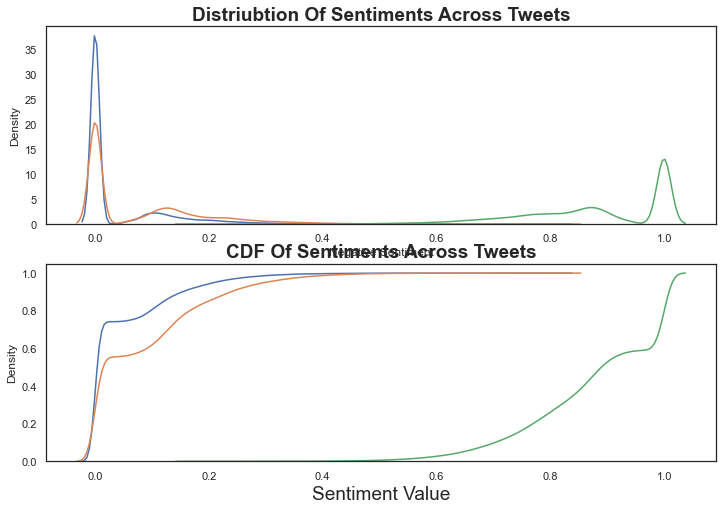

In [48]:
plt.subplot(2,1,1)
plt.title('Distriubtion Of Sentiments Across Tweets',fontsize=19,fontweight='bold')
sns.kdeplot(f_data['Negative Sentiment'],bw=0.1)
sns.kdeplot(f_data['Positive Sentiment'],bw=0.1)
sns.kdeplot(f_data['Neutral Sentiment'],bw=0.1)
plt.subplot(2,1,2)

#estimate a cumulative distribution function
plt.title('CDF Of Sentiments Across Tweets',fontsize=19,fontweight='bold')
sns.kdeplot(f_data['Negative Sentiment'],bw=0.1,cumulative=True)
sns.kdeplot(f_data['Positive Sentiment'],bw=0.1,cumulative=True)
sns.kdeplot(f_data['Neutral Sentiment'],bw=0.1,cumulative=True)
plt.xlabel('Sentiment Value',fontsize=19)
plt.show()

A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset, analagous to a histogram. KDE represents the data using a continuous probability density curve in one or more dimensions

In [49]:
#Sorting And Feature Engineering
f_data = f_data.sort_values(by='date')

In [50]:
ft_data=f_data.copy()
ft_data['date'] = pd.to_datetime(f_data['date']).dt.date
ft_data['year'] = pd.DatetimeIndex(ft_data['date']).year
ft_data['month'] = pd.DatetimeIndex(ft_data['date']).month
ft_data['day'] = pd.DatetimeIndex(ft_data['date']).day

In [51]:
ft_data

,text,user_location,date,tweet_punct,sentiments,nltk_cmp_score,Positive Sentiment,Neutral Sentiment,Negative Sentiment,year,month,day
44,#FDA authorizes #PfizerBioNTech #coronavirus vaccine for emergency use\nhttps://t.co/VZ6bDPbbPG,Egypt,2020-12-12,fda authorizes pfizerbiontech coronavirus vaccine for emergency use\nhttpstcovzbdpbbpg,"{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.3818}",-0.3818,0.000001,0.794001,0.206001,2020,12,12
43,Trump announces #vaccine rollout 'in less than 24 hours'\n\nThe first Americans will be vaccinat...,"London, England",2020-12-12,trump announces vaccine rollout in less than hours\n\nthe first americans will be vaccinated ag...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
42,#CovidVaccine #Pfizer-BioNTech COVID-19 #PfizerBioNTech #COVID19 #CapeTown https://t.co/uCpwv0S4nl,NaN,2020-12-12,covidvaccine pfizerbiontech covid pfizerbiontech covid capetown httpstcoucpwvsnl,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
41,FACT SHEET FOR RECIPIENTS AND CAREGIVERS\n\n#PfizerBioNTech \n#CovidVaccine \n\nhttps://t.co/V0m...,USA🇺🇸,2020-12-12,fact sheet for recipients and caregivers\n\npfizerbiontech \ncovidvaccine \n\nhttpstcovmnvtwj,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
40,@mirekR9 @sputnikvaccine @AstraZeneca it's the only one which doesn't have any side effects \n\n...,"Wales, United Kingdom",2020-12-12,mirekr sputnikvaccine astrazeneca its the only one which doesnt have any side effects \n\nthe pf...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
...,...,...,...,...,...,...,...,...,...,...,...,...
34676,@sumanthraman My grandfather who is 85 took #Covaxin @BharatBiotech who never had any issues. An...,chennai,2021-03-24,sumanthraman my grandfather who is took covaxin bharatbiotech who never had any issues and he d...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2021,3,24
29923,2nd Dose Covid-19 Vaccine Done. #VaccinesWork #Sinopharm #COVID19Vaccine https://t.co/1zpo2KmWGj,Zimbabwe,2021-03-24,nd dose covid vaccine done vaccineswork sinopharm covidvaccine httpstcozpokmwgj,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2021,3,24
33254,Jabbed on the clock!! Welcome inside me dearest #covid_19 Vaccine!! #oxfordastrazeneca .... the ...,"Bedford, England",2021-03-24,jabbed on the clock welcome inside me dearest covid vaccine oxfordastrazeneca the one and only ...,"{'neg': 0.0, 'neu': 0.708, 'pos': 0.292, 'compound': 0.765}",0.7650,0.292001,0.708001,0.000001,2021,3,24
35569,PHARMACY and Poisons Board confirms approval for emergency use of Russia’s #SputnikV COVID vacci...,"Nairobi, Kenya.",2021-03-24,pharmacy and poisons board confirms approval for emergency use of russias sputnikv covid vaccine...,"{'neg': 0.239, 'neu': 0.644, 'pos': 0.117, 'compound': -0.4939}",-0.4939,0.117001,0.644001,0.239001,2021,3,24


### Daily Distribution of Sentiments over time

Divided into 3 partitions and calculated the mean and std deviations for each

In [52]:
f_data=f_data.reset_index().drop(columns=['index'])
#Dividing into 3 partitions and calculating the mean and std deviations for each
partitions = []
partitions.append(f_data.loc[44:np.round(len(f_data)/3,0)-1,:])
partitions.append(f_data.loc[np.round(len(f_data)/3,0):2*int(len(f_data)/3)-1,:])
partitions.append(f_data.loc[2*np.round(len(f_data)/3,0):3*int(len(f_data)/3)-1,:])


#Create Negative and positive mean & std deviation
neg_part_means =[]
neg_part_std   =[]
pos_part_means =[]
pos_part_std   =[]
for part in partitions:
    neg_part_means.append(part['Negative Sentiment'].mean())
    neg_part_std.append(part['Negative Sentiment'].std())
    pos_part_means.append(part['Positive Sentiment'].mean())
    pos_part_std.append(part['Positive Sentiment'].std())
#Convert to DF
res_df = pd.DataFrame({'Positive Sentiment Mean':pos_part_means,'Negative Sentiment Mean':neg_part_means,'Positive Sentiment SD':pos_part_std,'Negative Sentiment SD':neg_part_std},
                     index = [f'Partition_{i}' for i in range(1,4)])


#print(res_df)

#transpose of matrix
res_df = res_df.T

#change column names
res_df = pd.DataFrame(res_df.values,columns=res_df.columns,index=['Positive Sentiment','Negative Sentiment','Positive Sentiment','Negative Sentiment'])
res_df = pd.concat([res_df.iloc[:2,:],res_df.iloc[2:,:]],axis=1)
res_df.columns = ['Partition_1_Mean','Partition_2_Mean','Partition_3_Mean','Partition_1_SD','Partition_2_SD','Partition_3_SD']
res_df

,Partition_1_Mean,Partition_2_Mean,Partition_3_Mean,Partition_1_SD,Partition_2_SD,Partition_3_SD
Positive Sentiment,0.082046,0.080612,0.079435,0.106982,0.110827,0.107399
Negative Sentiment,0.040839,0.032169,0.045415,0.077742,0.070225,0.082314


In [53]:
fig = make_subplots(rows=3, cols=2)

for idx,prt in enumerate(partitions):
    fig.add_trace(go.Scatter(x=prt['date'], y=prt['Positive Sentiment'],name=f'Positive Part {idx+1}'),
    row=idx+1, col=1)
    fig.add_trace(go.Scatter(x=prt['date'], y=prt['Negative Sentiment'],name=f'Negative Part {idx+1}'),
    row=idx+1, col=2)

fig.update_layout(height=600, width=900, title_text="Distibution Of Daily Sentiments Over Time Line For Each Partition")
fig.show()

Dec 2020- March 2021 higher density of positive tweets
March & April density of daily tweets seem to be less 

### Sentiment Average Change With Time

In [54]:
b_date_mean = ft_data.groupby(by='date').mean().reset_index()
b_date_std = ft_data.groupby(by='date').std().reset_index()

#date as common x axis
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Daily Average Positive Sentiment',  'Daily Average Negative Sentiment'))

#using plotly for graph: positive sentiment
fig.add_trace(go.Scatter(x=b_date_mean['date'], y=b_date_mean['Positive Sentiment'],name='Positive Sentiment Mean'),row=1, col=1)

#positive mean line
fig.add_shape(type="line",
    x0=b_date_mean['date'].values[0], y0=b_date_mean['Positive Sentiment'].mean(), x1=b_date_mean['date'].values[-1], y1=b_date_mean['Positive Sentiment'].mean(),
    line=dict(color="Red",
              dash="dashdot",
             ),
              name='Mean'
            )

#using plotly for graph: negative sentiment
fig.add_trace(go.Scatter(x=b_date_mean['date'], y=b_date_mean['Negative Sentiment'],name='Negative Sentiment Mean'),
              row=2, col=1
)

#negative mean
fig.add_shape(type="line",
    x0=b_date_mean['date'].values[0], y0=b_date_mean['Negative Sentiment'].mean(), x1=b_date_mean['date'].values[-1], y1=b_date_mean['Negative Sentiment'].mean(),
    line=dict(
        color="Red",
        dash="dashdot",
    ),
        name='Mean',
        xref='x2', 
        yref='y2'
)

fig['layout']['xaxis2']['title'] = 'Date'
fig.update_layout(height=700, width=900, title_text="Sentiment Average Change With Time")
fig.show()

From 18 December to December 29 there is a decline in the strength of the average negative sentiment, this could possibly be becasue the U.S. Food and Drug Administration issued authorization for the use of Pfizer-BioNTech vaccine on Dec 14,& Moderna on Dec 18

In [55]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Daily Deviation in Positive Sentiment',  'Daily Deviation in Negative Sentiment'))

#STD for positive sentiment
fig.add_trace(
    go.Scatter(x=b_date_std['date'], y=b_date_std['Positive Sentiment'],name='Positive Sentiment SD'),row=1, col=1)


#mean line
fig.add_shape(type="line",
    x0=b_date_std['date'].values[0], y0=b_date_std['Positive Sentiment'].mean(), x1=b_date_std['date'].values[-1], y1=b_date_std['Positive Sentiment'].mean(),
    line=dict(
        color="Red",
        dash="dashdot",
    ),
        name='Mean',
        xref='x1', 
        yref='y1'
)

#STD for negative sentiment
fig.add_trace(
    go.Scatter(x=b_date_std['date'], y=b_date_std['Negative Sentiment'],name='Negative Sentiment SD'),
    row=2, col=1
)

#negative mean
fig.add_shape(type="line",
    x0=b_date_std['date'].values[0], y0=b_date_std['Negative Sentiment'].mean(), x1=b_date_std['date'].values[-1], y1=b_date_std['Negative Sentiment'].mean(),
    line=dict(
        color="Red",
        dash="dashdot",
    ),
        name='Mean',
        xref='x2', 
        yref='y2'
)

fig['layout']['xaxis2']['title'] = 'Date'
fig.update_layout(height=700, width=900, title_text="Sentiment Deviation Change With Time")
fig.show()

The daily standard deviation of the positive and negative sentiments become more fluctuating , from March 24 to April 6 there seems to be a decline in the collected number of tweets

In [56]:
ft_data.head()

,text,user_location,date,tweet_punct,sentiments,nltk_cmp_score,Positive Sentiment,Neutral Sentiment,Negative Sentiment,year,month,day
44,#FDA authorizes #PfizerBioNTech #coronavirus vaccine for emergency use\nhttps://t.co/VZ6bDPbbPG,Egypt,2020-12-12,fda authorizes pfizerbiontech coronavirus vaccine for emergency use\nhttpstcovzbdpbbpg,"{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.3818}",-0.3818,0.000001,0.794001,0.206001,2020,12,12
43,Trump announces #vaccine rollout 'in less than 24 hours'\n\nThe first Americans will be vaccinat...,"London, England",2020-12-12,trump announces vaccine rollout in less than hours\n\nthe first americans will be vaccinated ag...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
42,#CovidVaccine #Pfizer-BioNTech COVID-19 #PfizerBioNTech #COVID19 #CapeTown https://t.co/uCpwv0S4nl,NaN,2020-12-12,covidvaccine pfizerbiontech covid pfizerbiontech covid capetown httpstcoucpwvsnl,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
41,FACT SHEET FOR RECIPIENTS AND CAREGIVERS\n\n#PfizerBioNTech \n#CovidVaccine \n\nhttps://t.co/V0m...,USA🇺🇸,2020-12-12,fact sheet for recipients and caregivers\n\npfizerbiontech \ncovidvaccine \n\nhttpstcovmnvtwj,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
40,@mirekR9 @sputnikvaccine @AstraZeneca it's the only one which doesn't have any side effects \n\n...,"Wales, United Kingdom",2020-12-12,mirekr sputnikvaccine astrazeneca its the only one which doesnt have any side effects \n\nthe pf...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12


In [57]:
neutral_thresh = 0.05

In [58]:
# Categorize scores into the sentiments of positive, neutral or negative using compund
ft_data['nltk_sentiment'] = ft_data['nltk_cmp_score'].apply(lambda c: 'Positive' if c >= neutral_thresh else ('Negative' if c <= -(neutral_thresh) else 'Neutral'))

In [59]:
ft_data['nltk_cmp_score'].describe()

count    37000.000000
mean         0.107773
std          0.366134
min         -0.968200
25%          0.000000
50%          0.000000
75%          0.401900
max          0.968100
Name: nltk_cmp_score, dtype: float64

In [60]:
# Define function to get value counts
def get_value_counts(col_name):
    count = pd.DataFrame(ft_data[col_name].value_counts())
    percentage = pd.DataFrame(ft_data[col_name].value_counts(normalize=True).mul(100))
    value_counts_df = pd.concat([count, percentage], axis = 1)
    value_counts_df = value_counts_df.reset_index()
    value_counts_df.columns = ['sentiment', 'counts', 'percentage']
    value_counts_df.sort_values('sentiment', inplace = True)
    value_counts_df['percentage'] = value_counts_df['percentage'].apply(lambda x: round(x,2))
    value_counts_df = value_counts_df.reset_index(drop = True)
    return value_counts_df

In [61]:
nltk_sentiment_df = get_value_counts('nltk_sentiment')
nltk_sentiment_df

,sentiment,counts,percentage
0,Negative,6882,18.60
1,Neutral,15645,42.28
2,Positive,14473,39.12


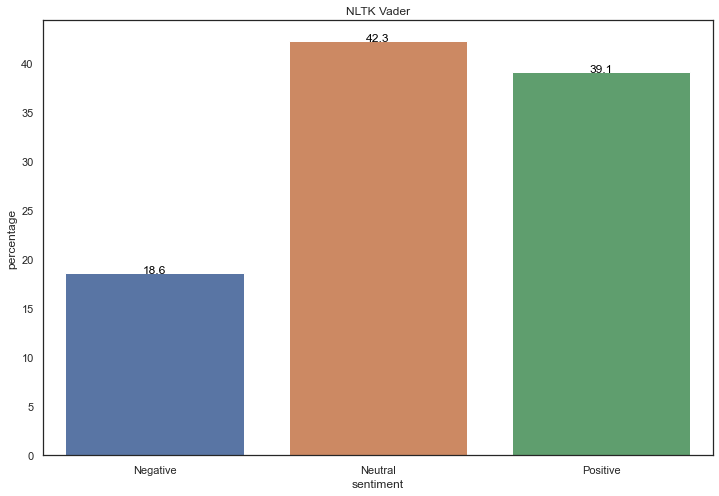

In [62]:
ax = sns.barplot(x="sentiment", y="percentage", data=nltk_sentiment_df)
ax.set_title('NLTK Vader')

for index, row in nltk_sentiment_df.iterrows():
    ax.text(row.name,row.percentage, round(row.percentage,1), color='black', ha="center")

In [63]:
Most_Positive = ft_data[ft_data['Positive Sentiment'].between(0.4,1)]
Most_Negative = ft_data[ft_data['Negative Sentiment'].between(0.25,1)]

In [64]:
Most_Positive

,text,user_location,date,tweet_punct,sentiments,nltk_cmp_score,Positive Sentiment,Neutral Sentiment,Negative Sentiment,year,month,day,nltk_sentiment
223,"@JoeBiden @KamalaHarris Thanks to you both for bringing in fresh air, positivity and God’s hand ...",United States,2020-12-13,joebiden kamalaharris thanks to you both for bringing in fresh air positivity and gods hand and ...,"{'neg': 0.0, 'neu': 0.552, 'pos': 0.448, 'compound': 0.9153}",0.9153,0.448001,0.552001,0.000001,2020,12,13,Positive
163,"I’m due to get the vaccine on Tuesday, super thrilled!\n#Pfizer #PfizerBioNTech #CoronavirusVaccine","Troy, Michigan; Serial ✈️",2020-12-14,im due to get the vaccine on tuesday super thrilled\npfizer pfizerbiontech coronavirusvaccine,"{'neg': 0.0, 'neu': 0.595, 'pos': 0.405, 'compound': 0.7783}",0.7783,0.405001,0.595001,0.000001,2020,12,14,Positive
143,Excited about tomorrow \nSo honoured to be part to this exciting team administering in primary c...,Birmingham UK,2020-12-14,excited about tomorrow \nso honoured to be part to this exciting team administering in primary c...,"{'neg': 0.0, 'neu': 0.555, 'pos': 0.445, 'compound': 0.916}",0.9160,0.445001,0.555001,0.000001,2020,12,14,Positive
90,Privileged be offered the #PfizerBioNTech vaccine. I would encourage everyone to take it up. It’...,London,2020-12-14,privileged be offered the pfizerbiontech vaccine i would encourage everyone to take it up itll h...,"{'neg': 0.0, 'neu': 0.596, 'pos': 0.404, 'compound': 0.8885}",0.8885,0.404001,0.596001,0.000001,2020,12,14,Positive
442,Take a breath and celebrate what happened today. Democracy won. Our constitution won. #PfizerBi...,NaN,2020-12-15,take a breath and celebrate what happened today democracy won our constitution won pfizerbionte...,"{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.9325}",0.9325,0.483001,0.517001,0.000001,2020,12,15,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...
30800,@BeTheBuddha Good luck. #Moderna 💉👍,OutlanderWorld,2021-03-24,bethebuddha good luck moderna,"{'neg': 0.0, 'neu': 0.253, 'pos': 0.747, 'compound': 0.7096}",0.7096,0.747001,0.253001,0.000001,2021,3,24,Positive
30777,Boomer fans ily so much I’m panicking rn but YALL ARE AMAZING 💚 #boomerna #boomernafans #Moderna,NaN,2021-03-24,boomer fans ily so much im panicking rn but yall are amazing boomerna boomernafans moderna,"{'neg': 0.095, 'neu': 0.498, 'pos': 0.407, 'compound': 0.8364}",0.8364,0.407001,0.498001,0.095001,2021,3,24,Positive
30768,Super!! #Kinder #Impfung #Studie #Moderna #KidCOVE https://t.co/xnj1eoTFwq,NaN,2021-03-24,super kinder impfung studie moderna kidcove httpstcoxnjeotfwq,"{'neg': 0.0, 'neu': 0.496, 'pos': 0.504, 'compound': 0.7964}",0.7964,0.504001,0.496001,0.000001,2021,3,24,Positive
35598,@sputnikvaccine A true Reflection on the Efficient of the #SputnikV @sputnikvaccine,"Nairobi,Kenya",2021-03-24,sputnikvaccine a true reflection on the efficient of the sputnikv sputnikvaccine,"{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.6808}",0.6808,0.412001,0.588001,0.000001,2021,3,24,Positive


### Common words among Positive and Negative tweets

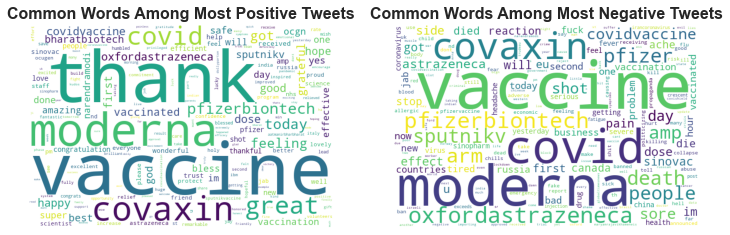

In [65]:
Most_Positive_text = ' '.join(Most_Positive.tweet_punct)
Most_Negative_text = ' '.join(Most_Negative.tweet_punct)


pwc = WordCloud(width=600,height=400,collocations = False,background_color='white').generate(Most_Positive_text)
nwc = WordCloud(width=600,height=400,collocations = False,background_color='white').generate(Most_Negative_text)

plt.subplot(1,2,1)
plt.title('Common Words Among Most Positive Tweets',fontsize=16,fontweight='bold')
plt.imshow(pwc)
plt.axis('off')
plt.subplot(1,2,2)
plt.title('Common Words Among Most Negative Tweets',fontsize=16,fontweight='bold')
plt.imshow(nwc)
plt.axis('off')

plt.show()

### Top 10 coomon words

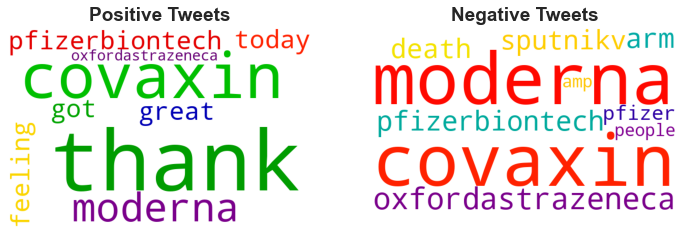

In [66]:
l_t = Most_Positive_text
new_stopwords = ['vaccine', 'covid']

stopword = nltk.corpus.stopwords.words('english') + new_stopwords 

w1_dict = dict()
for word in l_t.split():
    w= word.strip()
    wn = nltk.stem.WordNetLemmatizer()
    w= wn.lemmatize(w)
    if w in stopword:
        continue
    else:
        w1_dict[w] = w1_dict.get(w,0)+1
w1_dict = {k: v for k, v in sorted(w1_dict.items(), key=lambda item: item[1],reverse=True)}

l_t = Most_Negative_text
w2_dict = dict()
for word in l_t.split():
    w= word.strip()
    wn = nltk.stem.WordNetLemmatizer()
    w= wn.lemmatize(w)
    if w in stopword:
        continue
    else:
        w2_dict[w] = w2_dict.get(w,0)+1
w2_dict = {k: v for k, v in sorted(w2_dict.items(), key=lambda item: item[1],reverse=True)}

top_10_pos = list(w1_dict.keys())[:10]
top_10_neg = list(w2_dict.keys())[:10]

plt.subplot(1,2,1)
w_c = WordCloud(width=600,height=400,collocations = False,colormap='nipy_spectral',background_color='white').generate(' '.join(top_10_pos))
plt.title('Positive Tweets',fontsize=19,fontweight='bold')
plt.imshow(w_c)
plt.axis('off')
plt.subplot(1,2,2)
w_c = WordCloud(width=600,height=400,collocations = False,colormap='nipy_spectral',background_color='white').generate(' '.join(top_10_neg))
plt.title('Negative Tweets',fontsize=19,fontweight='bold')
plt.imshow(w_c)
plt.axis('off')
plt.show()

### Locations with Positive & negatice Tweets

In [67]:
# fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Top 10 Most Positive Locations Contributes',  'Top 10 Most Negative Locations Contributes'))

fig.add_trace(
    go.Bar(x=Most_Positive.user_location.value_counts()[:10].index, y=Most_Positive.user_location.value_counts()[:10].values,name='Number Of Tweets'),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=Most_Negative.user_location.value_counts()[:10].index, y=Most_Negative.user_location.value_counts()[:10].values,name='Number Of Tweets'),
    row=2, col=1
)

fig.update_layout(height=700, width=900)
fig.show()

London is seen to have high number of positive tweets
Toronto ,Canada seems to have high number of positive tweets

In [91]:
from sklearn.linear_model import LogisticRegression # fiiting log model
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.naive_bayes import GaussianNB # train a Gaussian Naive Bayes classifier on the training set

from sklearn.model_selection import train_test_split # dataset splititng
from sklearn import metrics # metrics
from sklearn.preprocessing import LabelEncoder # for label encoding


## Data spliting
## lets create dataset to use 

dataset = ft_data.iloc[:, 5:]

## Label Encoding

# creating instance of labelencoder
labelencoder = LabelEncoder()

# Assigning numerical values and storing in another column
dataset['nltk_sentiment'] = labelencoder.fit_transform(dataset['nltk_sentiment'])

dataset_encoded = dataset

# get the locations
X = dataset_encoded.iloc[:, :-1] # features
y = dataset_encoded.iloc[:, -1] # labels

# split the dataset
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.3, random_state=0)


In [86]:
## Classification Techniques
# 1. Logistic Regression


logreg = LogisticRegression()
logreg.fit(X_train, y_train)

# Now we can predict which type of weather condition is likely to take place.
logreg.predict([[-0.3818, 0.000001, 0.794001, 0.206001, 2020, 12, 12]])


c:\users\o\appdata\local\programs\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\users\o\appdata\local\programs\python\python37\lib\site-packages\sklearn\base.py:451: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names



array([1])

In [87]:
# Evaluating the Algorithm using error metrics

## Make predictions on the test set
y_predd =logreg.predict(X_test)

print('MAE Logistic Regression:', metrics.mean_absolute_error(y_test, y_predd))  
print('MSE Logistic Regression:', metrics.mean_squared_error(y_test, y_predd))  
print('RMSE Logistic Regression:', np.sqrt(metrics.mean_squared_error(y_test, y_predd)))

print("Accuracy for Logistic Regression:",metrics.accuracy_score(y_test, y_predd))

MAE Logistic Regression: 0.07387387387387387
MSE Logistic Regression: 0.08306306306306306
RMSE Logistic Regression: 0.2882066325799305
Accuracy for Logistic Regression: 0.9307207207207208


In [89]:
## Classification Techniques
# 2. Decision trees


# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [90]:
# Evaluating the Algorithm using error metrics

## Make predictions on the test set
y_predd =clf.predict(X_test)

print('MAE Decision trees:', metrics.mean_absolute_error(y_test, y_predd))  
print('MSE Decision trees:', metrics.mean_squared_error(y_test, y_predd))  
print('RMSE Decision trees:', np.sqrt(metrics.mean_squared_error(y_test, y_predd)))

print("Accuracy for Decision trees:",metrics.accuracy_score(y_test, y_predd))

MAE Decision trees: 9.009009009009009e-05
MSE Decision trees: 9.009009009009009e-05
RMSE Decision trees: 0.00949157995752499
Accuracy for Decision trees: 0.9999099099099099


In [92]:
## Classification Techniques
# 3. Naive Bayes classifier

# instantiate the model
gnb = GaussianNB()


# fit the model
gnb.fit(X_train, y_train)

GaussianNB()

In [93]:
# Evaluating the Algorithm using error metrics

## Make predictions on the test set
y_predd =gnb.predict(X_test)

print('MAE Naive Bayes:', metrics.mean_absolute_error(y_test, y_predd))  
print('MSE Naive Bayes:', metrics.mean_squared_error(y_test, y_predd))  
print('RMSE Naive Bayes:', np.sqrt(metrics.mean_squared_error(y_test, y_predd)))

print("Accuracy for Naive Bayes:",metrics.accuracy_score(y_test, y_predd))

MAE Naive Bayes: 0.016486486486486488
MSE Naive Bayes: 0.02099099099099099
RMSE Naive Bayes: 0.14488268009320848
Accuracy for Naive Bayes: 0.9857657657657658
